# Energy Consumption Prediction
- ### using **RNN** and **LSTM**
- ### RNN  Train/Test R2 score : **75.71%**, **61.90%**
- ### LSTM Train/Test R2 score : **73.86%**, **59.69%**

- Course Name :         Applied Machine Learning
- Course instructor:    Sohail Tehranipour
- Student Name :        Afshin Masoudi Ashtiani
- Project 10 :           Energy Consumption Prediction
- Date :                September 2024
- Files :               3/3

<img src="https://www.heatherhomes.in/wp-content/uploads/2017/11/Reduce-Energy-Consumption-at-Home.jpg">

## Step 1 : Install required libraries

In [1]:
!pip install numpy pandas
!pip install matplotlib seaborn plotly 
!pip install scikit-learn keras

## Step 2 : Import required libraries

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from keras import Sequential, layers, optimizers, models
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

# Mount google drive
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Warnings
import warnings
warnings.filterwarnings('ignore')

## Step 3 : Load and prepare the dataset (Energy Consumption)

In [3]:
data_dir = '/kaggle/input/hourly-energy-consumption'

data_path = os.path.join(data_dir, 'PJME_hourly.csv')
energy_df = pd.read_csv(data_path)

energy_df.info()
energy_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  145366 non-null  object 
 1   PJME_MW   145366 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


,Datetime,PJME_MW
121078,2015-03-09 23:00:00,30590.0
2108,2002-10-05 22:00:00,30791.0
83236,2011-07-02 01:00:00,28852.0
122367,2015-01-14 17:00:00,40189.0
31420,2005-06-01 12:00:00,33885.0


- ### Set 'Datetime' to index

In [4]:
energy_df.set_index(keys='Datetime', inplace=True)
energy_df.sample(5)

,PJME_MW
Datetime,
2012-05-02 04:00:00,21734.0
2003-08-04 15:00:00,46462.0
2017-07-28 18:00:00,41523.0
2014-08-16 19:00:00,32879.0
2003-09-15 10:00:00,37681.0


- ### Convert 'Datetime' type into datetime

In [5]:
energy_df.index = pd.to_datetime(energy_df.index)
energy_df = energy_df.sort_index()
energy_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145366 entries, 2002-01-01 01:00:00 to 2018-08-03 00:00:00
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   PJME_MW  145366 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


- ### Visulize the data

In [6]:
px.line(energy_df, y='PJME_MW')

## Step 4 : Data Cleaning

- ### Handle **missing values**

In [7]:
energy_df.isnull().sum()

PJME_MW    0
dtype: int64

In [8]:
# Handle Missing Values
print(f'> Shape of energy dataset before handling missing values: {energy_df.shape}')
energy_df.dropna(inplace=True)
print(f'> Shape of energy dataset after  handling missing values: {energy_df.shape}')

> Shape of energy dataset before handling missing values: (145366, 1)
> Shape of energy dataset after  handling missing values: (145366, 1)


- ### Handle **outliers**

In [9]:
energy_df.describe()

,PJME_MW
count,145366.000000
mean,32080.222831
std,6464.012166
min,14544.000000
25%,27573.000000
50%,31421.000000
75%,35650.000000
max,62009.000000


In [10]:
def plot_bell_curve(data: pd.DataFrame, feature_name: str):
    # Calculate the mean and standard deviation
    mean = data[feature_name].mean()
    std_dev = data[feature_name].std()

    # Create the histogram
    fig = px.histogram(data, x=feature_name, nbins=500, 
                       title="Bell Curve", 
                       histnorm='probability density')  # Normalize for probability density
    fig.update_traces(marker=dict(color="blue", opacity=0.5))

    # Create the bell curve using a range of x values
    x_values = np.linspace(data[feature_name].min(), data[feature_name].max(), 1000)
    y_values = (1 / (std_dev * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x_values - mean) / std_dev) ** 2)

    # Add bell curve to the existing figure
    fig.add_trace(go.Scatter(x=x_values, y=y_values, mode='lines', 
                             name='Bell Curve', line=dict(color='red', width=2)))

    # Update layout titles
    fig.update_layout(
        title='Hourly Energy Consumption with Bell Curve',
        xaxis_title=feature_name,
        yaxis_title="Density",
        template='plotly',
        showlegend=True
    )

    fig.show()

def plot_box(data: pd.DataFrame, feature_name: str):
    """Plots a box plot for the specified feature in the given DataFrame."""
    
    # Create a box plot
    fig = px.box(data, x=feature_name, points="all")  # Show all points to visualize outliers
    
    # Add titles and labels
    fig.update_layout(
        title=f'Box Plot of {feature_name}',
        xaxis_title=feature_name,
        yaxis_title='Value',
        template='plotly'
    )

    # Show the figure
    fig.show()

plot_bell_curve(energy_df, 'PJME_MW')
plot_box(energy_df, 'PJME_MW')

- ### Eliminate PJME under 19000 MW

In [11]:
print(f'> Shape of energy dataset before handling PJME_MW limits is {energy_df.shape}.')
energy_df = energy_df.query('PJME_MW > 19_000')
print(f'> Shape of energy dataset after handling PJME_MW limits is {energy_df.shape}.')

> Shape of energy dataset before handling PJME_MW limits is (145366, 1).
> Shape of energy dataset after handling PJME_MW limits is (145351, 1).


## Step 5 : Exploratory Data Analysis (EDA)

In [12]:
energy_df.describe()

,PJME_MW
count,145351.000000
mean,32081.810473
std,6462.435417
min,19085.000000
25%,27575.000000
50%,31421.000000
75%,35650.000000
max,62009.000000


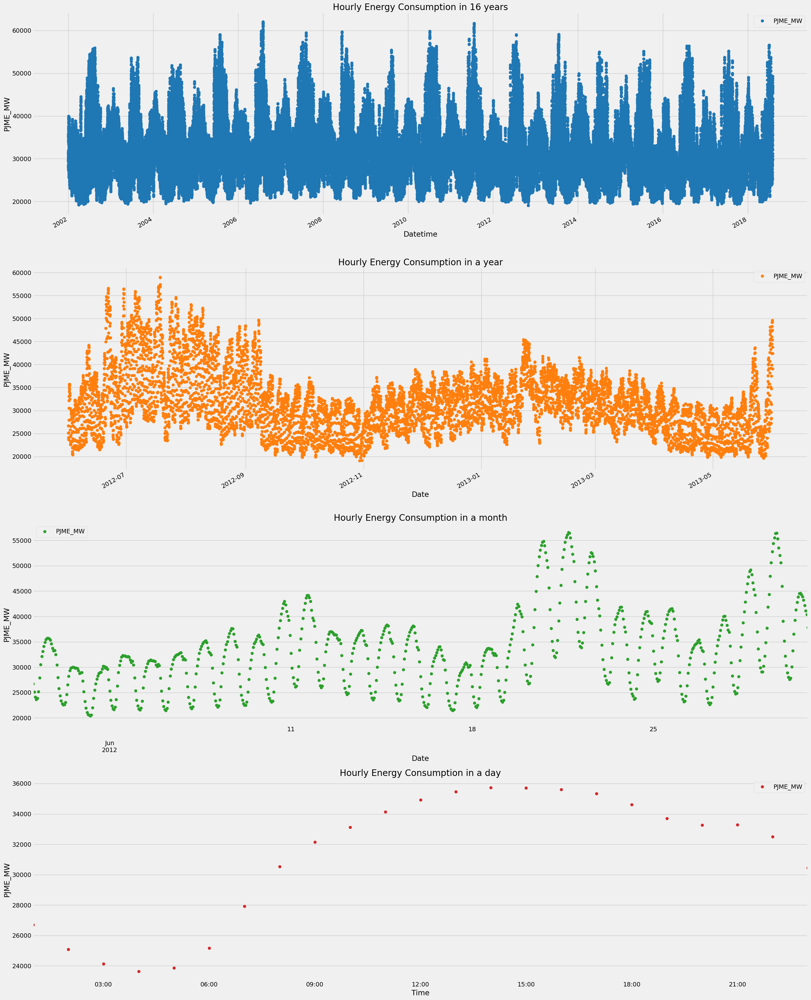

In [13]:
def calculate_dates(date_str: str):
    """Generate date ranges based on the input date."""
    date_parts = list(map(int, date_str.split('-')))
    start_date = pd.Timestamp(year=date_parts[2], month=date_parts[0], day=date_parts[1])
    return {
        'one_year': start_date + pd.DateOffset(years=1),
        'one_month': start_date + pd.DateOffset(months=1),
        'one_day': start_date + pd.DateOffset(days=1),
    }

def display_hourly_energy_consumption(data: pd.DataFrame, date: str = '06-01-2012'):
    years = (data.index[-1] - data.index[0]).days // 365

    date_ranges = calculate_dates(date)

    fig, axs = plt.subplots(4, 1, figsize=(26, 4 * 8))  # Adjusted figsize for clarity

    # Main Data Plot
    data.plot(y='PJME_MW', style='o', ax=axs[0], color=color_pal[0])
    axs[0].set_title(f'Hourly Energy Consumption in {years} years')
    axs[0].set_ylabel('PJME_MW')

    # Iterating over each time frame to create plots
    timeframes = [('Year', date_ranges['one_year'], color_pal[1]),
                  ('Month', date_ranges['one_month'], color_pal[2]),
                  ('Day', date_ranges['one_day'], color_pal[3])]
    
    for ax, (label, end_date, color) in zip(axs[1:], timeframes):
        time_frame_data = data[(data.index > date) & (data.index < end_date)]
        time_frame_data.plot(y='PJME_MW', style='o', ax=ax, color=color)
        ax.set_title(f'Hourly Energy Consumption in a {label.lower()}')
        ax.set_ylabel('PJME_MW')
        ax.set_xlabel('Date' if label.lower() != 'day' else 'Time')
    
    plt.tight_layout()  # Adjusts subplot params to give specified padding
    plt.show()
    
display_hourly_energy_consumption(energy_df, '06-01-2012')

## Step 6 : Create features and lag features

In [14]:
def create_features(data: pd.DataFrame) -> pd.DataFrame:
    data['Hour'] = data.index.hour
    data['Day'] = data.index.day
    data['Month'] = data.index.month
    data['Quarter'] = data.index.quarter
    data['Year'] = data.index.year
    data['DayOfWeek'] = data.index.dayofweek
    data['DayOfYear'] = data.index.dayofyear
    data['WeekOfYear'] = data.index.isocalendar().week
    return data

df = create_features(energy_df)
df.info()
df.sample(5)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145351 entries, 2002-01-01 01:00:00 to 2018-08-03 00:00:00
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   PJME_MW     145351 non-null  float64
 1   Hour        145351 non-null  int32  
 2   Day         145351 non-null  int32  
 3   Month       145351 non-null  int32  
 4   Quarter     145351 non-null  int32  
 5   Year        145351 non-null  int32  
 6   DayOfWeek   145351 non-null  int32  
 7   DayOfYear   145351 non-null  int32  
 8   WeekOfYear  145351 non-null  UInt32 
dtypes: UInt32(1), float64(1), int32(7)
memory usage: 6.8 MB


,PJME_MW,Hour,Day,Month,Quarter,Year,DayOfWeek,DayOfYear,WeekOfYear
Datetime,,,,,,,,,
2017-12-27 22:00:00,40825.0,22,27,12,4,2017,2,361,52
2005-09-13 23:00:00,37822.0,23,13,9,3,2005,1,256,37
2011-08-23 07:00:00,27237.0,7,23,8,3,2011,1,235,34
2012-03-04 16:00:00,28648.0,16,4,3,1,2012,6,64,9
2009-11-15 03:00:00,21469.0,3,15,11,4,2009,6,319,46


## Step 7 : Split the data into Train/Test/Forecast sets

In [15]:
from pandas.tseries.offsets import DateOffset

train_start = energy_df.index.min()
train_end = '2017-08-03 00:00:00'
train = df.loc[train_start:train_end]
print(f"> Train date starts at {train_start} and ends at {train_end}.")

test_start = energy_df[energy_df.index > train_end].index[0]
test_end = energy_df.index.max()
test = df.loc[test_start:test_end]
print(f"> Test date starts at {test_start} and ends at {test_end}.")


forecast_start = test_end - pd.DateOffset(month=2)
forecast_end = forecast_start + pd.DateOffset(years=1)
date_generated = pd.date_range(forecast_start, forecast_end, freq='1h')
forecast = pd.DataFrame(columns=['PJME_MW'], index=date_generated)
forecast = create_features(forecast)
print(f"> Forecast date starts at {forecast_start} and ends at {forecast_end}.")

print(f'> Train    shape: {train.shape}')
print(f'> Test     shape: {test.shape}')
print(f'> Forecast shape: {forecast.shape}')

> Train date starts at 2002-01-01 01:00:00 and ends at 2017-08-03 00:00:00.
> Test date starts at 2017-08-03 01:00:00 and ends at 2018-08-03 00:00:00.
> Forecast date starts at 2018-02-03 00:00:00 and ends at 2019-02-03 00:00:00.
> Train    shape: (136591, 9)
> Test     shape: (8760, 9)
> Forecast shape: (8761, 9)


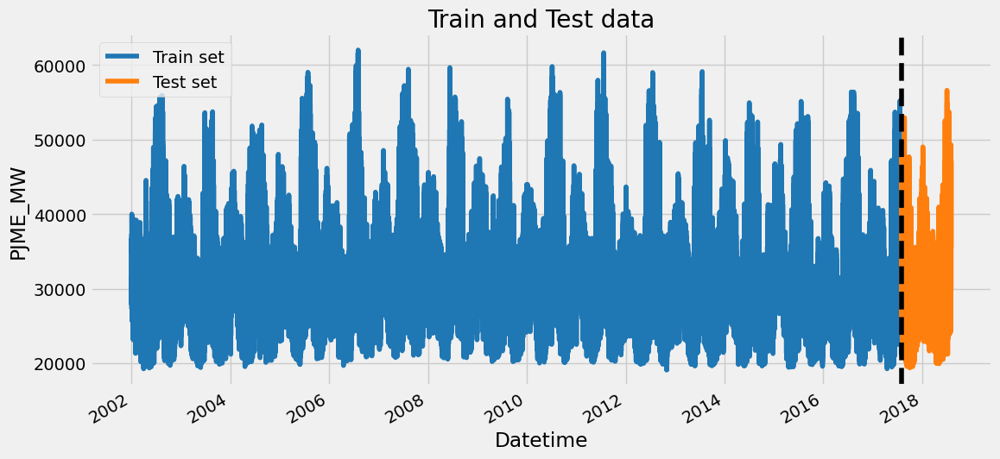

In [16]:
fig, ax = plt.subplots(figsize=(12, 6))
train.plot(y='PJME_MW', ax=ax, label= "Train set", color=color_pal[0])
test.plot(y='PJME_MW', ax=ax, label = "Test set", color=color_pal[1])
ax.axvline(train.index[-1], color='black', ls='--')
ax.set_title('Train and Test data')
ax.set_ylabel('PJME_MW')
ax.legend()

## Step 8 : Data preprocessing

In [17]:
ss_scaler = StandardScaler()
mm_scaler = MinMaxScaler()

columns = energy_df.columns.tolist()
features = columns[1:]
terget = columns[0]

X_train = ss_scaler.fit_transform(train[features])
y_train = mm_scaler.fit_transform(train[terget].to_numpy().reshape(-1, 1))

X_test = ss_scaler.transform(test[features])
y_test = mm_scaler.transform(test[terget].to_numpy().reshape(-1, 1))

X_forecast = ss_scaler.transform(forecast[features])

print(f'> X_train, y_train shape: {X_train.shape}, {y_train.shape}')
print(f'> X_test, y_test   shape: {X_test.shape}, {y_test.shape}')
print(f'> X_forecast       shape: {X_forecast.shape}')

> X_train, y_train shape: (136591, 8), (136591, 1)
> X_test, y_test   shape: (8760, 8), (8760, 1)
> X_forecast       shape: (8761, 8)


## Step 9 : Train RNN & LSTM models

- ### **RNN model**

In [18]:
def create_rnn_model(input_shape = (X_train.shape[1],1), units = 64, dropout_rate = 0.2) -> Sequential:
  # Initializing the RNN
  model = Sequential()

  # Input layer
  model.add(layers.Input(shape=input_shape))

  # RNN layers and dropout regularization
  model.add(layers.SimpleRNN(units, return_sequences=True))
  model.add(layers.Dropout(dropout_rate))

  model.add(layers.SimpleRNN(units))
  model.add(layers.Dropout(dropout_rate))

  # Output layer
  model.add(layers.Dense(1))

  # Compile the RNN
  model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['r2_score'])

  # Summary the RNN
  model.summary()

  return model

# Creating the RNN
input_shape = (X_train.shape[1], 1)
units = 64
dropout_rate = 0.2
rnn_model = create_rnn_model(input_shape, units, dropout_rate)

# Fitting the RNN
epochs = 50
batch_size = 1024

# simple early stopping
model_dir = '/kaggle/working/'
rnn_model_path = os.path.join(model_dir, 'best_rnn_model.keras')
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
mc = ModelCheckpoint(rnn_model_path, monitor='val_loss', mode='min', verbose=1, save_best_only=True)

rnn_history = rnn_model.fit(
    x= X_train,
    y= y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data= (X_test, y_test),
    verbose=1, 
    callbacks=[mc]
)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)               │ (None, 8, 64)               │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_1 (SimpleRNN)             │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,545 (49.00 KB)

 Trainable params: 12,545 (49.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1575 - r2_score: -5.8886
Epoch 1: val_loss improved from inf to 0.01459, saving model to /kaggle/working/best_rnn_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1570 - r2_score: -5.8653 - val_loss: 0.0146 - val_r2_score: 0.2673
Epoch 2/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0296 - r2_score: -0.2870
Epoch 2: val_loss improved from 0.01459 to 0.01433, saving model to /kaggle/working/best_rnn_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0296 - r2_score: -0.2855 - val_loss: 0.0143 - val_r2_score: 0.2804
Epoch 3/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0229 - r2_score: 0.0039
Epoch 3: val_loss improved from 0.01433 to 0.01416, saving model to /kaggle/working/best_rnn_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0228 - r2_score: 0.0044 - val_loss: 0.0142 - val_r2_score: 0.2893
Epoch 4/50
132/134 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0200 - 

- ### **LSTM model**

In [19]:
def create_lstm_model(input_shape = (X_train.shape[1],1), units = 64, dropout_rate = 0.2) -> Sequential:
    # Initializing the LSTM
    model = Sequential()

    # Input layer
    model.add(layers.Input(shape=input_shape))

    # LSTM layers and dropout regularization
    model.add(layers.LSTM(units, return_sequences=True))
    model.add(layers.Dropout(dropout_rate))

    model.add(layers.LSTM(units))
    model.add(layers.Dropout(dropout_rate))

    # Output layer
    model.add(layers.Dense(1))

    # Compile the LSTM
    model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['r2_score'])

    # Summary the LSTM
    model.summary()

    return model

# Creating the LSTM
input_shape = (X_train.shape[1], 1)
units = 64
dropout_rate = 0.2
lstm_model = create_lstm_model(input_shape, units, dropout_rate)

# Fitting the LSTM
epochs = 50
batch_size = 1024

# simple early stopping
model_dir = '/kaggle/working/'
lstm_model_path = os.path.join(model_dir, 'best_lstm_model.keras')
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
mc = ModelCheckpoint('best_lstm_model.keras', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

lstm_history = lstm_model.fit(
    x= X_train,
    y= y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data= (X_test, y_test),
    verbose=1, 
    callbacks=[mc]
)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 8, 64)               │          16,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 49,985 (195.25 KB)

 Trainable params: 49,985 (195.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0368 - r2_score: -0.6015
Epoch 1: val_loss improved from inf to 0.01670, saving model to best_lstm_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.0366 - r2_score: -0.5934 - val_loss: 0.0167 - val_r2_score: 0.1616
Epoch 2/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0181 - r2_score: 0.2068
Epoch 2: val_loss improved from 0.01670 to 0.01630, saving model to best_lstm_model.keras
134/134 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.0181 - r2_score: 0.2070 - val_loss: 0.0163 - val_r2_score: 0.1816
Epoch 3/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0171 - r2_score: 0.2487
Epoch 3: val_loss did not improve from 0.01630
134/134 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.0171 - r2_score: 0.2488 - val_loss: 0.0167 - val_r2_score: 0.1612
Epoch 4/50
133/134 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0166 - r2_score: 0.2708
Epoch 4: val_loss improved from 0.01630 to 0.01562, saving model to bes

- ### Visualize the **training history**

In [20]:
def plot_history(history=None, model_name: str = None, figure_directory: str = None, ylim_pad=[0, 0], figsize=(10, 10), show_grid=True):
    """Plot the training history of loss and R2 score with dual y-axes."""

    if history is None:
        raise ValueError(f"The {model_name}-history object must be provided.")

    x_labels = 'Epoch'

    # Creating a figure with two subplots
    fig, axs = plt.subplots(2, 1, figsize=figsize)

    metrics = ['loss', 'r2_score']
    titles = ['Train', 'Validation']

    for i, title in enumerate(titles):
        # Prepare data
        y1 = history.history[metrics[0]] if title == 'Train' else history.history['val_loss']
        y2 = history.history[metrics[1]] if title == 'Train' else history.history['val_r2_score']

        ax1 = axs[i]

        # Plotting the loss
        ax1.plot(y1, label=f'{title} Loss', color='tab:blue')
        ax1.set_xlabel(x_labels)
        ax1.set_ylabel('Loss', color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')
        ax1.set_title(f'{model_name} {title} Loss and R2 score per Epoch')
        ax1.legend(loc='lower left')

        # Create a second y-axis for the R² score
        ax2 = ax1.twinx()
        ax2.plot(y2, label=f'{title} R2 score', color='tab:red')
        ax2.set_ylabel('R2 score', color='tab:red')
        ax2.tick_params(axis='y', labelcolor='tab:red')
        ax2.legend(loc='upper left')

        # Optional ylim padding
        if ylim_pad:
            ax1.set_ylim([min(y1) - ylim_pad[0], max(y1) + ylim_pad[1]])
            ax2.set_ylim([min(y2) - ylim_pad[0], max(y2) + ylim_pad[1]])

        if show_grid:
            ax1.grid()

    fig.tight_layout()  # Adjust subplots to fit into figure area.

    if figure_directory:
        plt.savefig(f"{figure_directory}/{model_name}_training_history.png")  # Save to directory

    plt.show()

>> Training History of RNN:


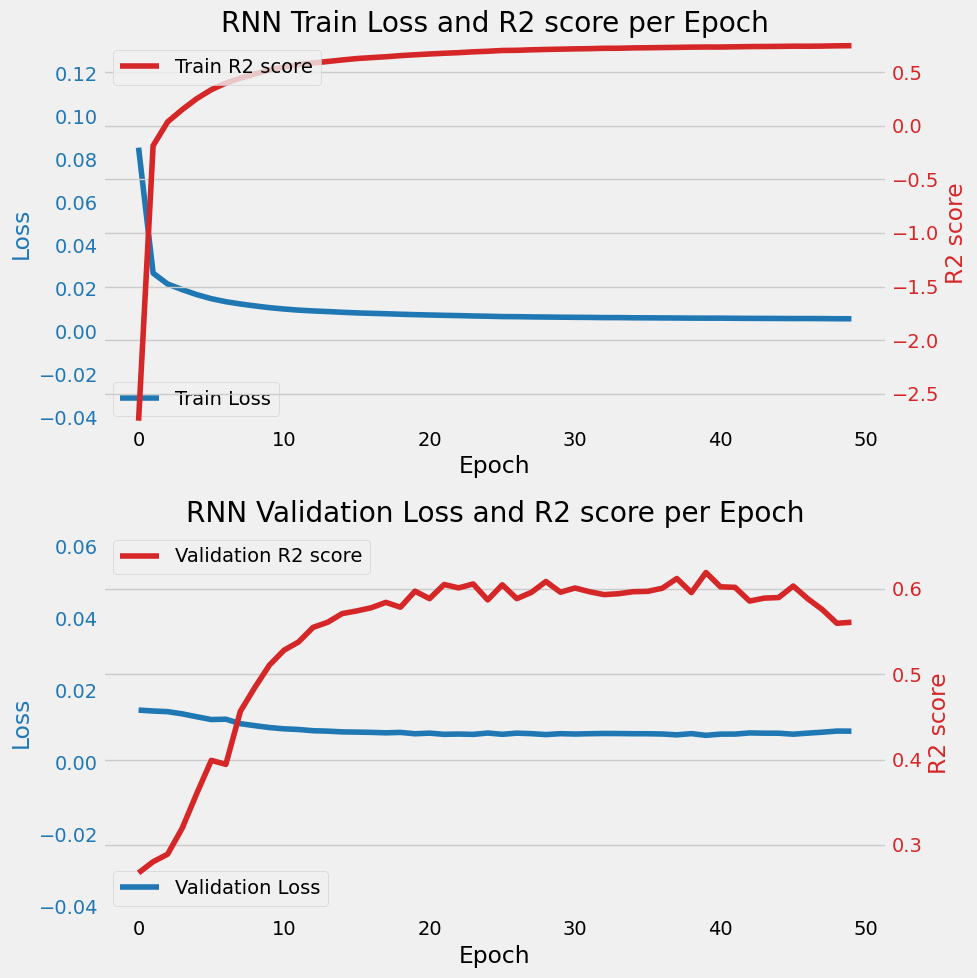

>> Training History of LSTM:


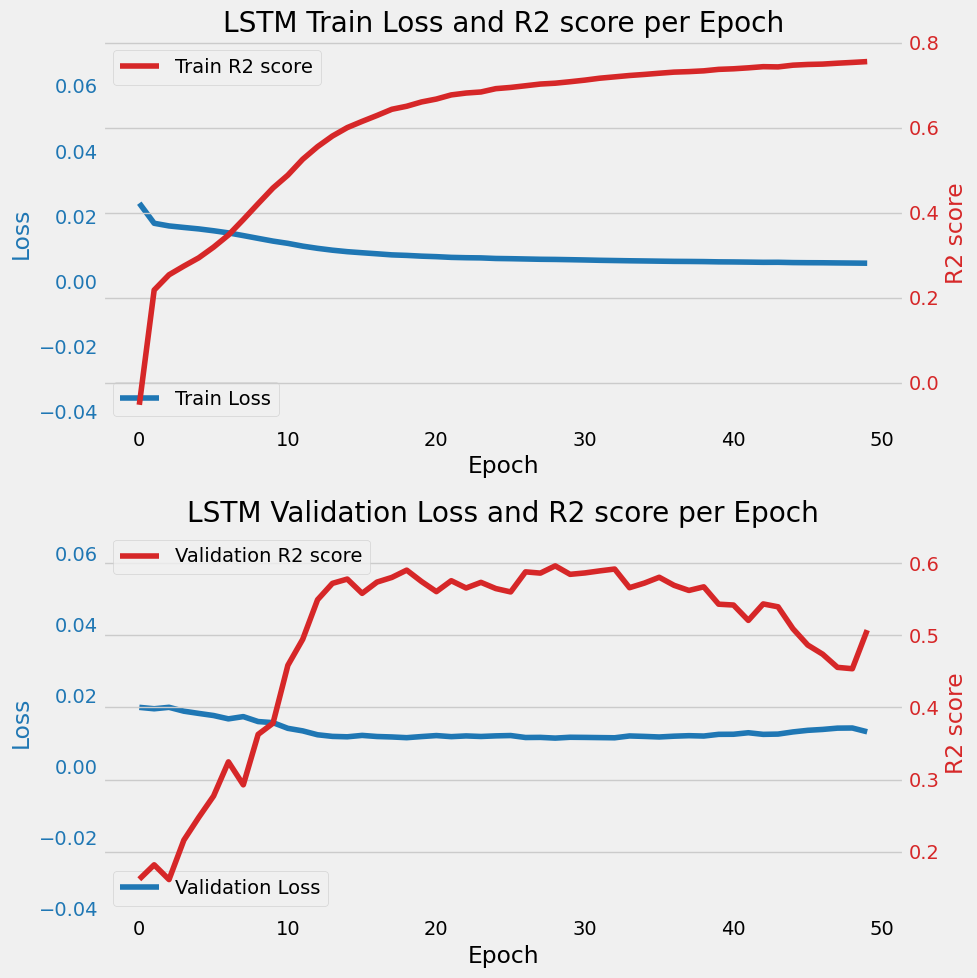

In [21]:
figure_dir = '/kaggle/working/'

print('>> Training History of RNN:')
plot_history(history=rnn_history, model_name='RNN', figure_directory=figure_dir, ylim_pad=[0.05, 0.05], figsize=(10, 10))
print('>> Training History of LSTM:')
plot_history(history=lstm_history, model_name='LSTM', figure_directory=figure_dir, ylim_pad=[0.05, 0.05], figsize=(10, 10))

## Step 10 : Evaluate models

In [22]:
def evaluate_model(model, model_name, X_train, y_train, X_test, y_test) -> dict:
    """Evaluates the performance of the model on training and testing data."""
    # Evaluate the model on training and testing data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_r2_score = r2_score(y_train, y_train_pred)
    test_r2_score = r2_score(y_test, y_test_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

    # Print evaluation results
    print(f'>>>> {model_name} Evaluation ')
    print(f'>  Train R2 score : {train_r2_score * 100:.2f}%')
    print(f'>  Test  R2 score : {test_r2_score * 100:.2f}%')
    print(f'>  Train RMSE     : {train_rmse:.4f}')
    print(f'>  Test  RMSE     : {test_rmse:.4f}')

    return {
        'Train_R2' : train_r2_score, 
        'Test_R2' : test_r2_score, 
        'Train_RMSE' : train_rmse, 
        'Test_RMSE' : test_rmse}
    
eval_list = []
best_rnn_model = models.load_model(rnn_model_path)
best_lstm_model = models.load_model(lstm_model_path)

eval_list.append(evaluate_model(best_rnn_model, 'RNN', X_train, y_train, X_test, y_test)) 
eval_list.append(evaluate_model(best_lstm_model, 'LSTM', X_train, y_train, X_test, y_test)) 
evaluation_df = pd.DataFrame(eval_list, index=['RNN', 'LSTM'])
evaluation_df

4269/4269 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
>>>> RNN Evaluation 
>  Train R2 score : 75.71%
>  Test  R2 score : 61.90%
>  Train RMSE     : 0.0744
>  Test  RMSE     : 0.0871
4269/4269 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
>>>> LSTM Evaluation 
>  Train R2 score : 73.86%
>  Test  R2 score : 59.66%
>  Train RMSE     : 0.0772
>  Test  RMSE     : 0.0896


,Train_R2,Test_R2,Train_RMSE,Test_RMSE
RNN,0.757055,0.619044,0.074449,0.087105
LSTM,0.738579,0.596567,0.077228,0.089638


## Step 11 : Forecast and Visualize the future data

- ### Predict the future data

In [23]:
# Predict the future data
rnn_forecast_predictions = best_rnn_model.predict(X_forecast)
lstm_forecast_predictions = best_lstm_model.predict(X_forecast)

# Inverse the predictions
forecast['RNN Predicted PJME_MW'] = mm_scaler.inverse_transform(rnn_forecast_predictions.reshape(-1, 1))
forecast['LSTM Predicted PJME_MW'] = mm_scaler.inverse_transform(lstm_forecast_predictions.reshape(-1, 1))
forecast.sample(5)

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


- ### Visualize **Train/Test/Forecast data**

In [24]:
import plotly.graph_objs as go

fig = go.Figure([
    go.Scatter(x=train.index, y=train['PJME_MW'], name='Train'),
    go.Scatter(x=test.index, y=test['PJME_MW'], name='Test'),
    go.Scatter(x=forecast.index, y=forecast['RNN Predicted PJME_MW'], name='RNN - Forecast'),
    go.Scatter(x=forecast.index, y=forecast['LSTM Predicted PJME_MW'], name='lstm - Forecast'),
])
fig.update_layout(title='Train, Test, and Predicted Future Data', xaxis_title='Datetime', yaxis_title='PJME_MW')
fig.show()

## Step 12 : Save RNN & LSTM models

In [25]:
# Save the model
model_dir = '/kaggle/working/'

rnn_model_path = os.path.join(model_dir, 'rnn_model.keras')
rnn_model.save(rnn_model_path)
print(f'> RNN model saved to {rnn_model_path}')

lstm_model_path = os.path.join(model_dir, 'lstm_model.keras')
lstm_model.save(lstm_model_path)
print(f'> LSTM model saved to {lstm_model_path}')

> RNN model saved to /kaggle/working/rnn_model.keras
> LSTM model saved to /kaggle/working/lstm_model.keras
